# Extreme precipitation: Changes under climate scenarios worfklow [Hazard assessment]
Click [![Binder](https://mybinder.org/badge_logo.svg)](https://mybinder.org/v2/gh/CLIMAAX/HEAVY_RAINFALL/main?labpath=EXTREME_PRECIPITATION_Hazard_Assessment.ipynb) to launch this notebook on MyBinder.<br>
Click [![Heavy Rainfall](https://img.shields.io/badge/HEAVY_RAINFALL-repository-blue)](https://github.com/CLIMAAX/HEAVY_RAINFALL/tree/main) to go to this workflow's GitHub repository.

This section outlines the guidelines for generating rainfall datasets representing current and future climate scenarios. The steps detailed here involve extracting annual maximum precipitation values, fitting various statistical distributions, and calculating return periods for specific durations and scenarios across Europe.

To demonstrate the practical application of hazard data assessment, we provide a specific example focused on the Catalonia region in Spain. In this example, EURO-CORDEX climate projections for precipitation flux at a 12km spatial resolution have been utilised for assessing future climate hazards. The timeframe from 1976-2005 represents historical simulations, while the period from 2041-2070 is used for climate projections.

:::{note}

To simplify your climate risk assessment of extreme precipitation, CRAHI-UPC has already prepared datasets for the European region for different Global/Regional chains, accessible at [link](https://climaax.github.io/crabook-test/resources/datasets/precipitation_idf_gcm_eur.html). These datasets are ready to be used directly in your risk assessment. You can find detailed instructions on how to use these datasets in the “**[Extreme precipitation: Changes under climate scenarios workflow [Risk assessment]](EXTREME_PRECIPITATION_Risk_Assessment.ipynb)**”

If you are following Path A, **you do not need to execute the steps outlined on this page to begin your risk assessment**. However, depending on your specific research needs, we encourage you to adapt the code for your local area and explore how critical impact rainfall thresholds may be affected under different climate change scenarios (refer to the [previous section](Extreme_precipitation_criticalthresholds.md) on critical thresholds for more details).
:::

## Prepare your workspace
:::{admonition} In this notebook we will use the following Python libraries:
:class: hint dropdown
* [cdsapi](https://cds-beta.climate.copernicus.eu/how-to-api) - A library to request data from the datasets listed in the CDS catalogue.
* [numpy](https://numpy.org/doc/stable/) - A powerful library for numerical computations in Python, widely used for array operations and mathematical functions.
* [xarray](https://docs.xarray.dev/en/stable/) - Introduces labels in the form of dimensions, coordinates and attributes on top of raw NumPy-like arrays for a more intuitive experience.
* [rioxarray](https://corteva.github.io/rioxarray/stable/) - An extension of the xarray library that simplifies working with geospatial raster data.
* [scipy](https://docs.scipy.org/doc/scipy/) - Provides algorithms for optimization, statistics and many other classes of problems.
* [matplotlib](https://matplotlib.org/stable/) -  A versatile plotting library in Python, commonly used for creating static, animated, and interactive visualizations.
* [cartopy](https://scitools.org.uk/cartopy/docs/latest/) - A package designed for geospatial data processing in order to produce maps and other geospatial data analyses.
* [contextily](https://contextily.readthedocs.io/en/latest/) - To retrieve matplotlib compatible tile maps from the internet.
* [pyproj](https://pyproj4.github.io/pyproj/stable/index.html) - A Python interface to PROJ (cartographic projections and coordinate transformations library).
* [plotly](https://plotly.com/) - A Python Graphing Library

### Load libraries

In [2]:
# Libraries to download data and manage files
import os
import cdsapi
import zipfile
import datetime
import glob

# Libraries for numerical computations, array manipulation and statistics.
import numpy as np
import xarray as xr
import scipy.stats as sst

# Libraries to handle geospatial data
import rioxarray as rio
import pyproj

# Libraries to plot maps, charts and tables
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import from_levels_and_colors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.util import add_cyclic_point
import plotly.express as px
import plotly.graph_objects as go
import contextily as ctx

# Choosing the matplotlib backend
%matplotlib inline

### Select your area of interest

Let us define the coordinates of an area of interest. Based on these coordinates we will be able to clip the datasets for further processing.

To easily define an area in terms of geographical coordinates, you can go to the [Bounding Box Tool](https://boundingbox.klokantech.com) to select a region and get the coordinates. Make sure to select _CSV_ in the lower left corner and copy the values in the brackets below.

In [3]:
# Define the BOUNDING BOX for your desired region (CATALONIA in this example).
bbox = [0, 40.2, 3.3, 43.5]; areaname = 'Catalonia'

### Set your directory structure
The next cell will create the *extreme_precipitation_hazard* folder in the directory where the notebook is saved. You can change the path defined in the variable ```workflow_dir``` to create it elsewhere.

In [4]:
# Define the path for the extreme_precipitation_hazard folder.
workflow_dir = 'extreme_precipitation_hazard'
# Create the directory checking if it already exists.
os.makedirs(workflow_dir, exist_ok = True)

Now, we will create a subfolder for general data as well as specific subfolders to save data for our area of interest, plots generated by the code and new datasets computed within the workflow.

In [5]:
# Define directories for general data.
general_data_dir = os.path.join(workflow_dir, 'general_data')
# Define specific directories for the selected area
data_dir = os.path.join(workflow_dir, f'data_{areaname}')
results_dir = os.path.join(workflow_dir, f'results_{areaname}')
plots_dir = os.path.join(workflow_dir, f'plots_{areaname}')

# Create the directories checking if they already exist.
os.makedirs(general_data_dir, exist_ok = True)
os.makedirs(data_dir, exist_ok = True)
os.makedirs(results_dir, exist_ok = True)
os.makedirs(plots_dir, exist_ok = True)

## Step 1: Download the EURO-CORDEX from the Climate Data Store.
For this analysis, EURO-CORDEX climate projections for _precipitation flux_ at a 12km spatial resolution have been employed. These projections are readily accessible to the public through the [Climate Data Store](https://cds-beta.climate.copernicus.eu/datasets/projections-cordex-domains-single-levels?tab=overview) (CDS) portal. 
The EURO-CORDEX data can be downloaded through the CDS API. Learn how to use it [here](https://cds-beta.climate.copernicus.eu/how-to-api).

For this example, we will guide you through downloading ***two different 30-year frames*** from the EURO-CORDEX precipitation data: one corresponding to daily precipitation; the other corresponding to 3 hours time resolution, needed for sub-daily analysis. ***The selected timeframes are 1976-2005 (baseline or historic simulations) and 2041-2070 (climate projections).*** We will select a specific combination of General Circulation Model (GCM), Regional Climate model (RCM), and a Representative Concentration Pathway (RCP).

:::{note}
Feel free to explore the code and modify it according to your specific research needs (e.g., pair of models or scenarios). Explore the available data for CORDEX by referring to the resources found [here](https://cds-beta.climate.copernicus.eu/datasets/projections-cordex-domains-single-levels?tab=download). Notice that the start and end years differ from model to model.

:::

:::{warning}
EURO-CORDEX datasets are downloaded for all Europe (they cannot be pre-selected for our area), so it may take some hours to download, specially if you are interested in the 3-hour time-step
:::

Define in the next cell the specifications of the dataset you want to download.

In [6]:
# Global options for EURO-CORDEX data
GCM = 'ichec_ec_earth'
RCM = 'knmi_racmo22e'
RCP = 'rcp_8_5'

In [7]:
# Define global variables of the time-frame years for further use on the workflow.
GCM_str = GCM.replace('_','-')
RCP_str = RCP.replace('_','')

TIME_FRAMES = {
    'historical' :['1976', '2005'],
    RCP_str : ['2041', '2070'] 
}


To request data with CDS API, a specific list of the years has to be provided. Define in the next cell the dictionary that contains the necessary years for each experiment (historical and rcp). Remember to check with the [CDS Data Portal](https://cds-beta.climate.copernicus.eu/datasets/projections-cordex-domains-single-levels?tab=download) that years are well-defined.

In [8]:
# Define dictionary with listed years so CDS API understands the request.
YEARS_SPECIFICATION = {
    '3_hours': {  # The data is saved in 1-year files. 
        'historical': {
            'start_year': [str(i) for i in range(1976, 2006)],
            'end_year' : [str(i+1) for i in range(1976, 2006)]
        }, 
        RCP: {
            'start_year': [str(i) for i in range(2041, 2071)],
            'end_year' : [str(i+1) for i in range(2041, 2071)]
        }
    },
    'daily_mean': {  # The data is stored in 5-year files.
        'historical': {
            'start_year': [str(i) for i in range(1976, 2006, 5)],
            'end_year': [str(i+4) for i in range(1976, 2006, 5)]
        },
        RCP: {
            'start_year': [str(i) for i in range(2041, 2071, 5)],
            'end_year': [str(i+4) for i in range(2041, 2071, 5)]
        }
    }
}

We will loop over the temporal resolutions and time frames and save the downloaded data into the **general data directory**.
A subdirectory for the specific GCM and time-step will be also created to differentiate data if other datasets are later downloaded.

In [ ]:
# Change the KEY to your own
URL = "https://cds-beta.climate.copernicus.eu/api"
KEY = None
c = cdsapi.Client(url=URL, key=KEY)

for temp_res, runs in YEARS_SPECIFICATION.items():
    for experiment, years in runs.items():
        for y_start, y_end in zip(years['start_year'], years['end_year']):
            # Define name and path for zip and subfolder for the files
            zip_name_i = f"pr_{temp_res.replace('_','')}_{experiment.replace('_','')}.zip"
            zip_path_i = os.path.join(general_data_dir, GCM_str, zip_name_i)
            dir_path_i = os.path.join(general_data_dir, GCM_str, temp_res.replace('_',''))
            os.makedirs(dir_path_i, exist_ok=True)
            
            # Download from CDS
            c.retrieve(
                'projections-cordex-domains-single-levels',
                {
                    'format': 'zip',
                    'domain': 'europe',
                    'experiment': experiment,
                    'horizontal_resolution': '0_11_degree_x_0_11_degree',
                    'temporal_resolution': temp_res,
                    'variable': 'mean_precipitation_flux',
                    'gcm_model': GCM,
                    'rcm_model': RCM,
                    'ensemble_member': 'r1i1p1',
                    'start_year': y_start,
                    'end_year': y_end
                },
                zip_path_i)
            
            # Unzip the files in a specific directory within general data dir folder.
            with zipfile.ZipFile(zip_path_i, 'r') as zObject:
                    zObject.extractall(path=dir_path_i)
            
            # Remove zip file
            os.remove(zip_path_i)

If you want to download just one specific subset of data from CDS, you can use the next code snippet.

In [ ]:
# Change the KEY to your own
URL = "https://cds-beta.climate.copernicus.eu/api"
KEY = None
c = cdsapi.Client(url=URL, key=KEY)

# Define zip file's absolute path
zip_path = os.path.join(general_data_dir, 'download.zip')
dir_path = os.path.join(general_data_dir, 'name_folder')
os.makedirs(dir_path, exist_ok=True)

c.retrieve(
        'projections-cordex-domains-single-levels',
        {
            'format': '',
            'domain': '',
            'experiment': '',
            'horizontal_resolution': '',
            'temporal_resolution': '',
            'variable': '',
            'gcm_model': '',
            'rcm_model': '',
            'ensemble_member': '',
            'start_year': '',
            'end_year': '',
        },
        zip_path)

# Unzip the files in a specific directory within general data dir folder.
with zipfile.ZipFile(zip_path, 'r') as zObject:
    zObject.extractall(path=dir_path) 

# Remove zip file
os.remove(zip_path)

## Step 2: Explore the data.
The files from the CDS have a filename structure that describes the exact dataset contained. The general structure is the following: 

<p style="text-align: center;">pr_[domain]_[gcm]_[rcp]_[ensemble]_[rcm]_[version]_[temporal resolution]_[start day]_[end day]</p>

Load one of the files and explore the content and structure of the dataset. Notice the dimensions, coordinates, data variables, indexes and attributes as well as the description of the spatial reference system in *rotated_pole()_*.

In [8]:
# Define the absolute path for a specific file
filename_precipitation_example = 'pr_EUR-11_ICHEC-EC-EARTH_rcp85_r1i1p1_KNMI-RACMO22E_v1_3hr_2041010100-2042010100.nc'
path_precipitation_example = os.path.join(general_data_dir, GCM_str, '3hours', filename_precipitation_example)

# Open the netCDF file as a dataset using xarray
dataset_precipitation_example = xr.open_dataset(path_precipitation_example, decode_cf = True)

# Display said dataset
dataset_precipitation_example

<xarray.Dataset> Size: 2GB
Dimensions:       (rlon: 424, rlat: 412, time: 2920, bnds: 2)
Coordinates:
  * rlon          (rlon) float64 3kB -28.38 -28.27 -28.16 ... 17.93 18.05 18.16
    lon           (rlat, rlon) float64 1MB ...
  * rlat          (rlat) float64 3kB -23.38 -23.27 -23.16 ... 21.62 21.73 21.84
    lat           (rlat, rlon) float64 1MB ...
  * time          (time) datetime64[ns] 23kB 2041-01-01T01:30:00 ... 2041-12-...
Dimensions without coordinates: bnds
Data variables:
    rotated_pole  |S1 1B ...
    time_bnds     (time, bnds) datetime64[ns] 47kB ...
    pr            (time, rlat, rlon) float32 2GB ...
Attributes: (12/25)
    Conventions:                    CF-1.4
    contact:                        Erik van Meijgaard, KNMI, Regional Climat...
    experiment:                     RCP8.5 run
    experiment_id:                  rcp85
    realization:                    1
    driving_experiment:             ICHEC-EC-EARTH,rcp85,r1i1p1
    ...                             ...
    knmi_model_comment:             RACMO22E: baseline physics from ECMWF CY3...
    knmi_version_comment:           v1: reference version for Europe and othe...
    knmi_grib_path:                 mos.knmi.nl:/climreg/CXEUR12/eCS6-v441-fE...
    creation_date:                  2015-12-10T17:13:36Z
    c3s_disclaimer:                 ""
    tracking_id:                    hdl:21.14103/157ee1ba-f9ba-4f87-82f2-206f...

## Step 3: Extract the temporal series of annual maximum precipitation for sub-daily and daily resolution.

For this example, the annual maximum precipitation associated with a duration of 3 and 24 hours (derived from the 3-hour temporal step and the daily dataset respectively). 

We will follow the next steps:
1. Reproject the coordinates of our area of interest to match the dataset's reference system.
2. Define a function to cut/slice the original datasets (European scale).
3. Define a function called ```do_annual_maximum``` that:
   1. Computes the annual maximum precipitation for each time duration that we are interested.
   2. Converts units of precipitation from kg m-2 s-1 to mm over each duration.
   3. Saves the temporal series for each duration as a netCDF in the **data directory** for our region.
4. Apply ```do_annual_maximum``` to historical and future projections of EURO-CORDEX precipitation datasets.
5. Visualise the temporal series for a specific point.

Some important functions from the ```xarray``` library will be used:
* ```sel``` to select certain indexes of the dataset/dataarray by value.
* ```open_dataset``` to open netCDF files.
* ```rolling``` to roll over a dataarray within a specific dimension to apply an operation.
* ```resample``` to group by year for performing an operation.
* ```to_netcdf``` to save dataset/dataaray as netcdf.

In addition, the ```rioxarray``` library is used to properly write the coordinate reference system (CRS) so that the new files can be well visualized with a GIS application.

### 3.1 Reproject bounding box coordinates.

In [12]:
# Reproject usual coordinates (in WGS84) to EURO-CORDEX's CRS.
CRS = ccrs.RotatedPole(pole_latitude=39.25, pole_longitude=-162)
transformer = pyproj.Transformer.from_crs('epsg:4326',CRS)

# Original bounding box in usual lat/lon.
West, South, East, North = bbox

# New bounding box coordinates matching EURO-CORDEX CRS
RLON_MIN, RLAT_MIN, RLON_MAX, RLAT_MAX = transformer.transform_bounds(South, West, North, East)

In [13]:
print(f'The bounding box new coordinates in EURO-CORDEX reference system are \n {RLON_MIN}, {RLAT_MIN}, {RLON_MAX}, {RLAT_MAX}.') 

The bounding box new coordinates in EURO-CORDEX reference system are 
 -13.82050453871809, -9.423645743863924, -10.66980176143207, -5.66467325395815.


### 3.2 Define a function to select the values of our area.
The next function will slice each dataset before loading it to reduce execution time and resources.

In [11]:
# Auxiliary function to slice each dataset to a particular region (CATALONIA) with rotated coordinates.
def cut_to_region(ds):
    ds = ds.sel(rlat = slice(RLAT_MIN, RLAT_MAX), rlon = slice(RLON_MIN, RLON_MAX))
    return ds

### 3.3 Define the ```do_annual_maximum``` function.
First, we define the funcion that accumulates precipitation into the desired time duration, and extracts annual maxima. This function will be applied to all datasets (historical and future).

In [12]:
def do_annual_maximum(paths, durations, t_step, run):    
    """
    Generates and saves annual maximum precipitation as a netCDF file.

    Parameters:
        paths: a list of dataset's absolute paths to compute annual maximums.
        durations: list of durations (multiples of 3 or 24)
        t_step: time-step (3 or 24) of the raw data
        run: 'historical' or RCP_STR
        
    """
    if len(paths) == 0:
        print('Path list is empty. Please make sure paths are well-defined.')
        return
        
    for dur in durations:
        print(f'...for {dur}h duration...')
        ds_prec_max = None
        for path in paths:
            # Load a file and call the cut_to_region function to slice it.
            ds = xr.open_dataset(path, decode_coords='all')
            ds_i = cut_to_region(ds); del ds
            # Longitude of window to roll dataset
            window = int(dur/t_step)
            # Compute annual maximum
            da_i = ds_i.pr.rolling(time=window).sum().resample(time='YS').max(keep_attrs=True)
            # Convert units
            da_i = da_i * 3600 * t_step
            da_i.attrs['units'] = 'mm'
            # Concatenate dataarrays over years
            ds_prec_max = xr.concat([ds_prec_max, da_i], dim='time') if ds_prec_max is not None else da_i
        # Assign new 'duration' dimension to save this information and rename variable
        ds_prec_max = ds_prec_max.expand_dims(dim = {'duration': [dur]}, axis = 0).rename('pr_max')
        # Drop 'rotated_pole' coord and write CRS into the dataset.
        ds_prec_max = ds_prec_max.drop_vars({'rotated_pole'}).rio.write_crs(CRS, inplace=True)
        # Name of new netCDF file
        filename = f'pr_annualMax_{dur}h_{GCM_str}_{run}_{ds_prec_max.time.dt.year.values[0]}-{ds_prec_max.time.dt.year.values[-1]}.nc'
        # Save file in data directory
        print(f'...saving file in {data_dir} directory as {filename}...')
        ds_prec_max.to_netcdf(os.path.join(data_dir, filename))                


### 3.4 Generate the annual maximum precipitation datasets with the ```do_annual_maximum``` function.
Now, we will apply the function above to both the historical and the future 3-hour precipitation files. If you would like to derive the annual maximum precipitation for other durations from the 3-hour temporal step (e.g., 6-hour and 12-hour durations), you would need to specify it in the variable  ```durations```.

:::{note}
Although 24h precipitation can be obtained from both the 3h and the daily dataset, we propose here to use the second alternative.
:::

:::{warning}
This could take some time due to the large dataset the script is handling.
:::

In [17]:
timestep = '3hours'
durations = [3]
for run in TIME_FRAMES.keys(): # historical and future
    print(f'Computing annual maximum precipitation for {run} experiment...')
    paths = sorted(glob.glob(os.path.join(general_data_dir, GCM_str, timestep, f'pr_*{run}*.nc')))
    do_annual_maximum(paths, durations, 3, run)

Computing annual maximum precipitation for historical experiment...
...for 3h duration...
...saving file in extreme_precipitation_hazard/data_Catalonia directory as pr_annualMax_3h_ichec-ec-earth_historical_1976-2005.nc...
Computing annual maximum precipitation for rcp85 experiment...
...for 3h duration...
...saving file in extreme_precipitation_hazard/data_Catalonia directory as pr_annualMax_3h_ichec-ec-earth_rcp85_2041-2070.nc...


And we will do the same but using as input the historical and future projections for 24-hour precipitation.

In [38]:
timestep = 'dailymean'
durations = [24] # Durations to compute from the daily raw data.
for run in TIME_FRAMES.keys(): # historical and future
    print(f'Computing annual maximum precipitation for {run} experiment...')
    paths = sorted(glob.glob(os.path.join(general_data_dir, GCM_str, timestep, f'pr_*{run}*.nc')))
    do_annual_maximum(paths, durations, 24, run)

Computing annual maximum precipitation for historical experiment...
...for 24h duration...
...saving file in extreme_precipitation_hazard/data_Catalonia directory as pr_annualMax_24h_ichec-ec-earth_historical_1976-2005.nc...
Computing annual maximum precipitation for rcp85 experiment...
...for 24h duration...
...saving file in extreme_precipitation_hazard/data_Catalonia directory as pr_annualMax_24h_ichec-ec-earth_rcp85_2041-2070.nc...


### 3.5 Visualise the temporal series of annual maximum precipitation for a selected pixel.
Let us have a look to one of the new netCDF files that we have just created. 

We will define a point in the usual latitude and longitude coordinates (within our area of interest) and plot (with the ```plotly``` library) the evolution of the annual maximum precipitation series. We can also choose which duration and time-frame (within the ones downloaded) to plot.

Automatically, the code below will save the figure in the **plots directory** for our region.

In [13]:
# Select a location with latitude and longitude coordinates
POINT = [41.5, 2.]; location = 'Terrassa'

# Reproject to match EURO-CORDEX CRS
RPOINT = transformer.transform(POINT[0], POINT[1])

In [14]:
# Choose which duration and time frame to plot (from the ones computed previously).
duration_plot = 3
start_year_plot = 2041
end_year_plot = 2070
experiment_plot = 'rcp85'

In [15]:
# Load the maximum precipitation file.
filename_prec_max_plot = os.path.join(data_dir, f'pr_annualMax_{duration_plot}h_{GCM_str}_{experiment_plot}_{start_year_plot}-{end_year_plot}.nc')

ds_prec_max_plot = xr.open_dataset(filename_prec_max_plot)
da_prec_max_plot = ds_prec_max_plot.pr_max.sel(duration=duration_plot, rlat = RPOINT[1], rlon = RPOINT[0], method = 'nearest')
ds_prec_max_plot.close

# Converting dataarray to dataframe for plotly library to understand.
df_prec_max_plot = da_prec_max_plot.to_dataframe().reset_index()
# Define bar chart and customize it.
figure = px.bar(df_prec_max_plot, x="time", y="pr_max", title=f'Annual maximum precipitation for {duration_plot}h duration in {location}')
figure.update_layout(yaxis=dict(title="Precipitation (mm)"),
                     xaxis = dict(title="Year")) #, range=[10, max(df.precipitation)+5]))

figure.show()

# Save plot to plots directory
figure.write_image(os.path.join(plots_dir, 
                    f'pr_annualMax_{duration_plot}h_{start_year_plot}-{end_year_plot}_{location}.png'))

## Step 4: Define the function for fitting a probability distribution to the annual maximum precipitation series.
A probability distribution is a function representing the probability of occurrence of a random variable. By fitting a distribution to a set of hydrologic data (e.g., annual maximum precipitation data), the probabilistic information of the sample data can be compactly summarized in the function and its associated parameters. Distributions of extreme values, such as the annual maximum precipitation, have been shown by Fisher and Tippet (1928) and Jenkinson (1955) to converge to one of the three special cases of a single distribution called General Extreme Value (GEV) distribution.

We are going to define the ```do_fitting``` function that explores which one of the three special cases of the single GEV distribution best represents each pixel’s annual maximum precipitation series.  Feel free to modify the code to employ another probabilistic distribution function based on your region’s technical studies. However, keep in mind that in such cases a Goodness of Fit test (e.g., Kolmogorov-Smirnov) must be performed, the code is ready for but only GEV is checked.

In the following examples, we use the GEV function as first choice for fitting extreme precipitation.

:::{note}To read more about the GEV and other commonly used probabilistic distributions for hydrologic data and goodness of fit test refer to Applied Hydrology (Chow, 1988).
:::

In [16]:
# Function defined to fit a 1D-array (for one pixel) temporal series.
from scipy.stats import gumbel_r, genextreme, lognorm, ks_1samp

def do_fitting(ts_max, distributions=None, do_plots=False):
    """
    Returns distribution and parameters of fitting a temporal series.
    Also plots theorical vs empirical density plots (if the parameter do_plots is set to True).

    Parameters:
        ts_max: 1-D array of annual maximum precipitation values.
        distribution: list of probabilistic distribution used to fit data.
                      Default is genextreme.
        do_plots: True to plot the theorical vs empirical density plots
    
    """
    if distributions is None:
        distributions = [genextreme]
    
    # param dictionary
    param = {}
    # KS test dictionary
    ks_test = {}
    
    # Looping over distributions.
    for dist in distributions: 
        # Parameters for the GEV fitting.
        param[dist] = dist.fit(ts_max)
        # Kolmogorov-Smirnov test.
        ks_test[dist] = ks_1samp(ts_max, dist.cdf, param[dist])

        if do_plots:
            x = np.linspace(0, np.max(ts_max), 100)
            fig, ax = plt.subplots(1, 3, figsize=(15, 10))
            res = sst.probplot(ts_max, dist=dist, sparams=param[dist], plot=ax[0])
            ax[1].plot(x, dist.cdf(x, *param[dist]))
            ax[1].hist(ts_max, density=True, cumulative = True)
            ax[1].set_title('CDF')
            ax[1].legend(['Theoretical', 'Empirical'])
            ax[2].plot(x, dist.pdf(x, *param[dist]))
            ax[2].hist(ts_max, density=True)
            ax[2].set_title('PDF')
            ax[2].legend(['Theoretical', 'Empirical'])
            
            plt.suptitle(f'Plots for {dist.name} distribution.')
            plt.show()

    # Choose distribution in case there is more than one.
    # A lower value for the KS statistic means a better fit.
    best_fit = min(ks_test, key=ks_test.get)
    
    return best_fit, param[best_fit]


For example, if we select the same point as in Step 3.5, we can apply the ```do_fitting``` function over its maximum precipitation temporal series. Again, we can choose within the durations and time-frames that we have already processed.

In [17]:
# Select a location with latitude and longitude coordinates
POINT = [41.5, 2.]; location = 'Terrassa'

# Reproject to match EURO-CORDEX CRS
RPOINT = transformer.transform(POINT[0], POINT[1])

In [18]:
# Choose which duration and time frame to plot (from the ones computed previously).
duration_fit = 3
start_year_fit = 2041
end_year_fit = 2070
experiment_fit = "rcp85"

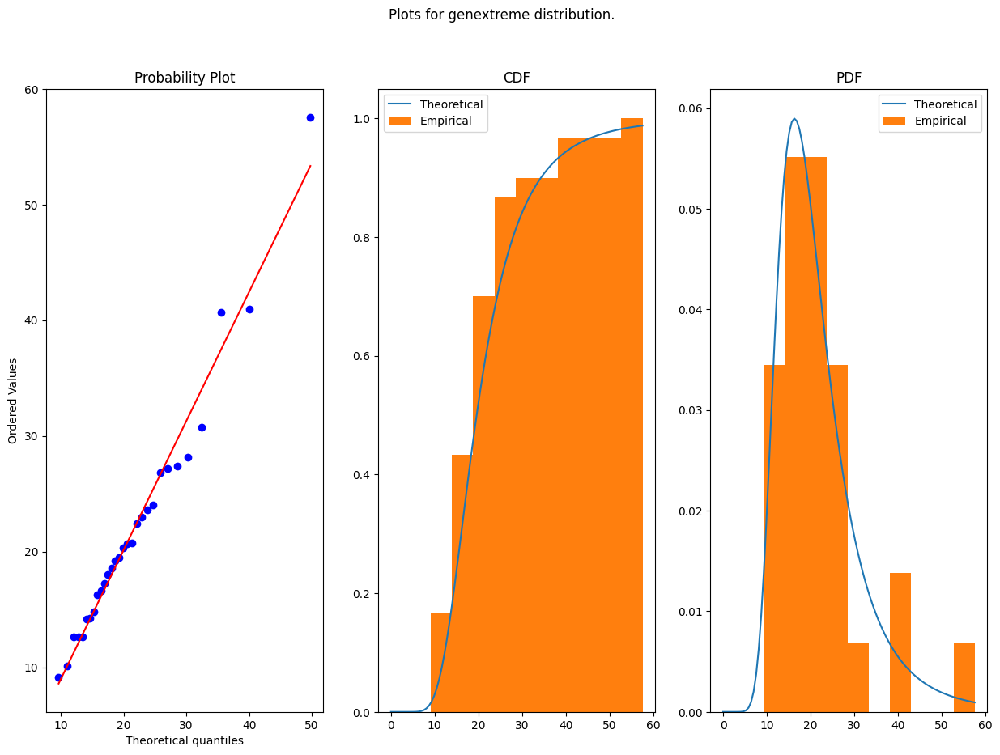

The parameters obtained for genextreme are (-0.15832511597860127, 17.233313469924326, 6.312609470667605)


In [19]:
# Load the maximum precipitation file.
filename_prec_max_fit = os.path.join(data_dir, f'pr_annualMax_{duration_fit}h_{GCM_str}_{experiment_fit}_{start_year_fit}-{end_year_fit}.nc')
ds_prec_max_fit = xr.open_dataset(filename_prec_max_fit)
da_prec_max_fit = ds_prec_max_fit.pr_max.sel(duration=duration_fit, rlat = RPOINT[1], rlon = RPOINT[0], method = 'nearest').values
ds_prec_max_fit.close

# Apply distribution_fit function to one point.
distribution_selected, parameters_selected = do_fitting(da_prec_max_fit, [genextreme], do_plots=True)
print(f'The parameters obtained for {distribution_selected.name} are {parameters_selected}')

## Step 5. Expected precipitation for different return periods.
The last step is to compute the expected precipitation for each duration (remember: 3, 6, 12 and 24 hours) and each frequency (probability of occurrence), which is usually referred as the return period in years (for instance: 2, 5, 10, 25, 50, 100, 200 and 500).

Then, the **return period** is an alternative way to describe the **frequency** magnitude. For example, a 100-year return period event means that it has a probability of occurrence of 1/100 in any given year, and **in average** this event will occur once in every 100 years. So, a lower return period translates to a higher probability of occurrence or frequency.

In order to do this, we declare the ```adjust_extreme_prec``` function where the mathematical expressions for fitting the data precipitation to the selected probability function and obtaining confidence intervals are defined. This function needs as input:
* a 1-D numpy array with the values of the temporal series.
* the probabilistic distribution function used to fit the data (optional: GEV is the default)
* the parameters that ```do_fitting``` returns (optional)
* a 1-D numpy array with the return periods (optional)

:::{note} More information regarding the equations employed to calculate return values and their confidence intervals can be found in Applied Hydrology (Chow, 1988).
:::

In [20]:
def adjust_extreme_prec(ts_max, dist_fit=None, param_fit=None, ret_per=None):
    
    # Select distribution (Needed for applying functions to whole region afterwards)
    if param_fit is None and dist_fit is None:
        dist_fit, param_fit = do_fitting(ts_max)
    elif not param_fit:
        dist_fit, param_fit = do_fitting(ts_max, dist_fit)
        
    # Define return years/frequency
    if ret_per is None:
        ret_per = np.asarray([2,5,10,25,50,100,200,500])

    n = ts_max.size
    data_log = np.log(ts_max)
    # Values and confidence intervals are defined using a frequency factor that varies with each distribution.
    # GEV distribution are differentiated by the shape parameter.
    if param_fit[0] == 0: # GUMBEL GEV I
        data = ts_max
    elif param_fit[0] != 0: # GEV II and III
        data = data_log
    else:
        raise Exception("Distribution selected has to be: gumbel_r or genextreme")
        
    # Level of confidence at 95%
    normal_level = np.power(1.96, 2)
    a = 1 - normal_level / 2 / (n - 1)
    freq_factor = -np.sqrt(6) / np.pi * (0.5772 + np.log(np.log(ret_per / (ret_per - 1))))
    b = np.power(freq_factor, 2) - normal_level / n

    # Calculate frequency factor for upper and lower confindence intervals.
    data_mean = data.mean()
    data_std = data.std()
    freq_factor_upper = freq_factor + np.sqrt(np.power(freq_factor, 2) - a * b)  
    freq_factor_lower = freq_factor - np.sqrt(np.power(freq_factor, 2) - a * b)
    
    # Compute expected precipitation and lower and upper confidence intervals.
    return_value = data_mean + freq_factor * data_std
    ci = [return_value, data_mean + data_std * freq_factor_lower / a,
          data_mean + data_std * freq_factor_upper / a]

    if param_fit[0] != 0:
        ci = np.exp(ci)
    
    return np.asarray(ci)

For example, if we select the same point (location place) as in Step 3.5, we can apply the ```adjust_extreme_prec``` function over its maximum precipitation temporal series. Again, we can choose within the durations and time-frames that we have already processed. The resulting graph shows the main fitting curve and the upper and lower confidence interval curves.

In [21]:
# Select a location with latitude and longitude coordinates
POINT = [41.5, 2.]; location = 'Terrassa'

# Reproject to match EURO-CORDEX CRS
RPOINT = transformer.transform(POINT[0], POINT[1])

In [22]:
# Choose which duration and time frame to plot (from the ones computed previously).
duration_rp = 3
start_year_rp = 2041
end_year_rp = 2070
expermient_rp = 'rcp85'

# Define return periods (year)
return_periods = np.asarray([2, 5, 10, 50, 100])

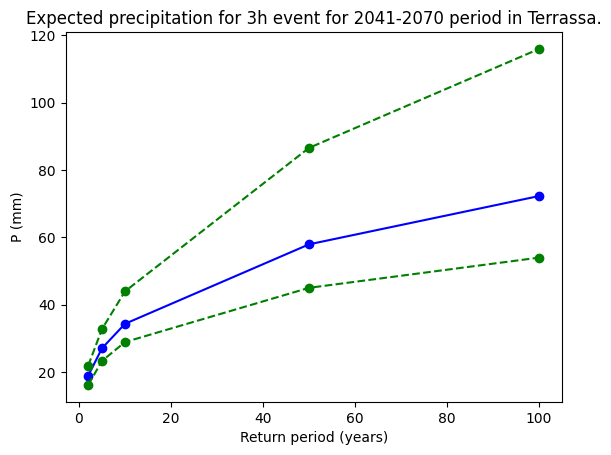

In [23]:
# Load the maximum precipitation file.
filename_prec_max_rp = os.path.join(data_dir, f'pr_annualMax_{duration_rp}h_{GCM_str}_{expermient_rp}_{start_year_rp}-{end_year_rp}.nc')
ds_prec_max_rp = xr.open_dataset(filename_prec_max_rp)
da_prec_max_rp = ds_prec_max_rp.pr_max.sel(duration=duration_rp, rlat = RPOINT[1], rlon = RPOINT[0], method = 'nearest').values
ds_prec_max_rp.close

# Apply adjust_extreme_prec function to one point.
expected_prec = adjust_extreme_prec(da_prec_max_rp, ret_per=return_periods);

## Code to plot the confidence intervals.
fig_values, ax_values = plt.subplots()
ax_values.plot(np.asarray(return_periods), expected_prec[0], '-bo',
               np.asarray(return_periods), expected_prec[1], '--go',
               np.asarray(return_periods), expected_prec[2] , '--go')
ax_values.set_xlabel('Return period (years)')
ax_values.set_ylabel('P (mm)')
ax_values.set_title(f'Expected precipitation for {duration_rp}h event for {start_year_rp}-{end_year_rp} period in {location}.')
plt.show()

file_rp = f'expected_prec_{duration_rp}h_{start_year_rp}-{end_year_rp}_{location}.png'
fig_values.savefig(os.path.join(plots_dir,file_rp))

## Step 6: Apply step 4 and 5 to an entire region.
After defining the functions for fitting a probabilistic distribution and calculating the expected rainfall intensities we are ready to apply them to an entire region.

We will follow the next steps:
1. Define for which durations and return periods we compute this values.
2. Select the probability distribution we want to use to fit the temporal series (in our case 'genextreme').
3. For each duration and each time-frame:
    1.  Apply ```adjust_extreme_prec``` (steps 4 and 5) to each pixel of our region using ```apply_along_axis``` from the ```numpy``` library.
    2.  Generate a new Dataset and save it as a netCDF in the **results directory** for our region.
:::{note}
Uncomment previous lines of code reserved to plot graphs and print information to have a cleaner outcome.
:::

In [24]:
# Select durations from the ones available.
DURATIONS = [3, 24]

In [25]:
# Define global options to pass to Step 5 adjust_extreme_prec function.
RETURN_PERIODS = np.asarray([2,5,10,25,50,100,200,500])
DISTRIBUTION = genextreme

In [26]:
# Loop over both time-frames to compute the expected intensties.
for run, years in TIME_FRAMES.items():
    for dur in DURATIONS:
        print(f'Reading {run} data for {dur}h temporal series...')
        
        # Load corresponding .nc file
        path_i = os.path.join(data_dir, f'pr_annualMax_{dur}h_{GCM_str}_{run}_{years[0]}-{years[1]}.nc')
        ds_i = xr.open_dataset(path_i)
    
        # Values of the variable pr_max as a numpy array
        data_i = ds_i.pr_max.values

        # Getting global attributes form original dataset.
        proj = ds_i.spatial_ref
        data_attrs = ds_i.pr_max.attrs
        data_dims = [*ds_i.pr_max.swap_dims({'time':'return_period'}).dims]
        coords = ds_i.drop_vars('time').coords
        
        print(f'Applying adjust_extreme_prec to {run} for {dur}h temporal series...')
        
        # Apply adjust_extreme_prec function to each pixel. Return a new ndarray with default arguments.
        idf_i = np.apply_along_axis(adjust_extreme_prec, 1, data_i, dist_fit=[DISTRIBUTION], ret_per=RETURN_PERIODS)

        # Create a new Dataset with the intensities. Some coordinates are the same as in the original file
        ds_idf_i = xr.Dataset(
            data_vars = {
                'idf' : (data_dims, idf_i[:,0,:,:,:], data_attrs),
                'lower_ci' : (data_dims, idf_i[:,1,:,:,:], data_attrs),
                'upper_ci' : (data_dims, idf_i[:,2,:,:,:], data_attrs),
                'spatial_ref' : proj,
                'prob_dist' : ([], DISTRIBUTION.name)
        })
        # Assign coordinates from original dataset
        ds_idf_i = ds_idf_i.assign_coords(coords)
        ds_idf_i = ds_idf_i.assign_coords({'return_period' : RETURN_PERIODS})

        filename_i = f'idf_{dur}h_{GCM_str}_{run}_{years[0]}-{years[1]}.nc'
        
        print(f'Saving new dataset as {filename_i}.')
        # Save as a new netCDF in results directory.
        ds_idf_i.to_netcdf(os.path.join(results_dir, filename_i))


Reading historical data for 3h temporal series...
Applying adjust_extreme_prec to historical for 3h temporal series...
Saving new dataset as idf_3h_ichec-ec-earth_historical_1976-2005.nc.
Reading historical data for 24h temporal series...
Applying adjust_extreme_prec to historical for 24h temporal series...
Saving new dataset as idf_24h_ichec-ec-earth_historical_1976-2005.nc.
Reading rcp85 data for 3h temporal series...
Applying adjust_extreme_prec to rcp85 for 3h temporal series...
Saving new dataset as idf_3h_ichec-ec-earth_rcp85_2041-2070.nc.
Reading rcp85 data for 24h temporal series...
Applying adjust_extreme_prec to rcp85 for 24h temporal series...
Saving new dataset as idf_24h_ichec-ec-earth_rcp85_2041-2070.nc.


## Step 7: Extract precipitation changes (%) relative to a defined year period.
Now that we have computed the expected precipitation for two different 30-year periods (see Step 1), we can compare their results. This exercise can help us to identify if there is a positive or negative precipitation change in the region relative to a climate baseline simulation.
 
In this example, we will compute the change of the rainfall (%) for 2041-2070 time-frame relative to the 1976-2005 period in Catalonia and save it in the **results directory** for our region.

In [27]:
# Open the netCDF files for two different 30-year period expected precipitation
# for one or more durations.
durations_change = [3, 24]

for dur in durations_change:
    # Load baseline precipitation
    file_baseline = f"idf_{dur}h_{GCM_str}_historical_{TIME_FRAMES['historical'][0]}-{TIME_FRAMES['historical'][1]}.nc"
    ds_baseline = xr.open_dataset(os.path.join(results_dir, file_baseline))
    # Select values
    data_baseline = ds_baseline.idf.sel(duration = dur).values
    
    # Load future precipitation
    file_future = f"idf_{dur}h_{GCM_str}_{RCP_str}_{TIME_FRAMES[RCP_str][0]}-{TIME_FRAMES[RCP_str][1]}.nc"
    ds_future = xr.open_dataset(os.path.join(results_dir, file_future))
    # Select values
    data_future = ds_future.idf.sel(duration = dur).values

    # Get coordinates and metadata from original dataset
    proj = ds_future.spatial_ref
    prob_dist = ds_future.prob_dist
    data_coords = ds_future.coords
    data_attrs = ds_future.idf.attrs
    data_attrs['units'] = '%'
    data_dims = [*ds_future.idf.dims]

    # Compute change (%) as a new DataArray
    data_change = (data_future - data_baseline)/data_baseline*100
    data_change = data_change.reshape(1,*data_change.shape)
                                        
    # Create dataset with realtive change values.
    ds_prec_change = xr.Dataset(
        data_vars={
            'idf_change' : (data_dims, data_change, data_attrs),
            'prob_dist' : prob_dist,
            'spatial_ref' : proj
        },
        coords = data_coords,
    )


    # Save as a netCDF in results directory
    file_change = file_future.replace('.nc', '_change.nc')
    ds_prec_change.to_netcdf(os.path.join(results_dir, file_change))
    del ds_prec_change
    

## Step 8: Plot the results.

### Extreme precipitation maps
First, we will visualise with a map of our area the expected precipitation computed in step 6 and the relative change of step 7. For this,  we will use the ```matplotlib```,  ```cartopy``` and ```contextily``` libraries and follow the next steps:
1. Define a colormap for precipitation and another one for relative change.
2. Select which duration and return period we want to visualise.
3. Plot the values in a map and automatically save the figure created in the **plots directory** for our region.

In [15]:
### MAP GLOBAL CHARACTERISTICS
# Define the projection as string
crs_string = CRS.to_string()

# Colormap definition for expected precipitation values
z_pal = [0., 10., 20, 25, 30, 35, 40, 45, 50, 60., 70., 80, 90., 100., 110, 120., 130, 140]
pal_rgb = ['#ffffff00', '#d6e2ffff', '#8db2ffff', '#626ff7ff', '#0062ffff', '#019696ff', '#01c634ff',
           '#63ff01ff', '#c6ff34ff', '#ffff02ff', '#ffc601ff', '#ffa001ff', '#ff7c00ff', '#ff1901ff', '#a20a28ff',
           '#9b159dff', '#d294d3ff', '#f6e9f6ff']
cmap, norm = from_levels_and_colors(z_pal, pal_rgb, extend='max')

# Colormap definition for relative change
cmap_rel = plt.get_cmap("RdYlGn")
relative_bounds = [-25, -20, -15, -10, -5, 0, 5, 10, 15, 20, 25]
norm_rel = mpl.colors.BoundaryNorm(relative_bounds, cmap_rel.N, extend='both')

In [16]:
duration_map = 24
return_period_map = 10

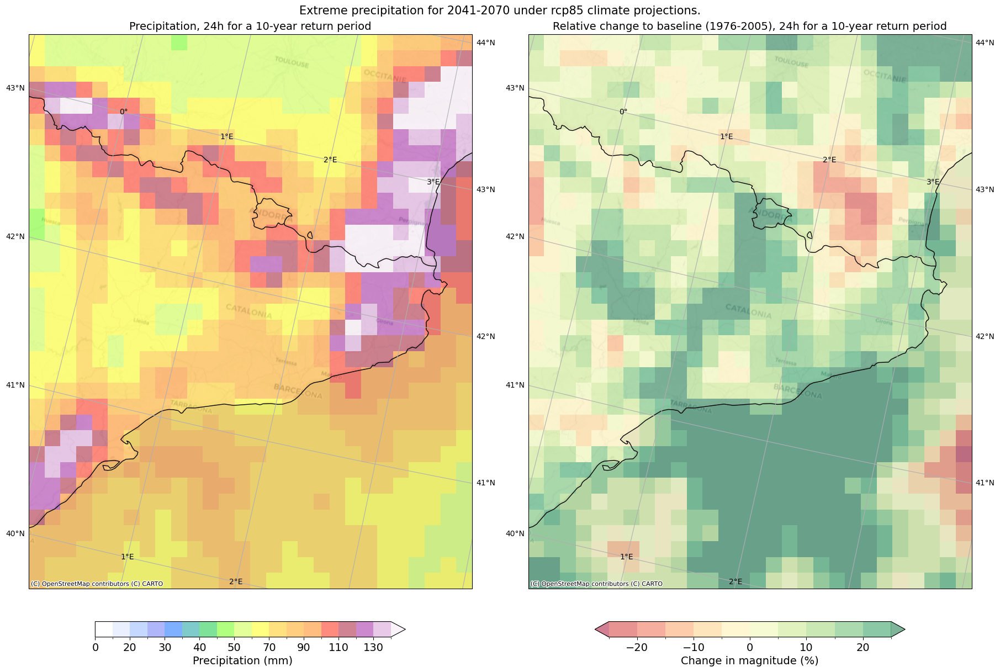

In [17]:
# Load datasets
file_idf = f'idf_{duration_map}h_{GCM_str}_{RCP_str}_{TIME_FRAMES[RCP_str][0]}-{TIME_FRAMES[RCP_str][1]}.nc'
file_idf_change = file_idf.replace('.nc', '_change.nc')

ds = xr.open_dataset(os.path.join(results_dir, file_idf), decode_cf=True)
ds_change = xr.open_dataset(os.path.join(results_dir, file_idf_change), decode_cf=True)

# Create map with matplotlib and cartopy
fig_map, ax_map = plt.subplots(1, 2, figsize=(18,12), layout="constrained",subplot_kw={'projection': CRS})
fig_map.canvas.header_visible = False
fig_map.suptitle(f'Extreme precipitation for {TIME_FRAMES[RCP_str][0]}-{TIME_FRAMES[RCP_str][1]} under {RCP_str} climate projections.', fontsize = 15)

# EXPECTED PRECIPITATION PLOT
data = ds.idf.sel(duration = duration_map, return_period = return_period_map); del ds
im = data.plot(ax=ax_map[0], norm=norm, cmap=cmap, alpha=0.5, add_colorbar=False); del data
# Title for absolute values subplot
ax_map[0].set_title(f'Precipitation, {duration_map}h for a {return_period_map}-year return period', fontsize = 14)

# Add and customize colorbar for absolute values
cbar = fig_map.colorbar(im, ax=ax_map[0], orientation='horizontal',shrink = 0.7)
cbar.set_label('Precipitation (mm)', fontsize = 14)
cbar.ax.tick_params(labelsize=14)

# RELATIVE CHANGE PLOT
data_change = ds_change.idf_change.sel(duration = duration_map, return_period = return_period_map); del ds_change
im_change = data_change.plot(ax = ax_map[1], norm = norm_rel, cmap = cmap_rel, alpha = 0.5, add_colorbar=False); del data_change
# Title for relative change subplot
ax_map[1].set_title(f"Relative change to baseline ({TIME_FRAMES['historical'][0]}-{TIME_FRAMES['historical'][1]}), {duration_map}h for a {return_period_map}-year return period", fontsize = 14)

# Add and customize colorbar for relative values
cbar_rel = fig_map.colorbar(im_change, ax=ax_map[1], orientation='horizontal',shrink = 0.7)  
cbar_rel.set_label('Change in magnitude (%)', fontsize = 14)
cbar_rel.ax.tick_params(labelsize=14)

# Add global features to both maps
for ax in ax_map:    
    ax.gridlines(draw_labels=True)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS)
    ctx.add_basemap(ax=ax, crs=crs_string, source=ctx.providers.CartoDB.Positron)

# Save figure in plot directory
file_map = f'prec_{GCM_str}_{RCP_str}_{TIME_FRAMES[RCP_str][0]}-{TIME_FRAMES[RCP_str][1]}_{duration_map}h_{return_period_map}.png'
fig_map.savefig(os.path.join(plots_dir, file_map))


### Precipitation versus frequency curves
To gain information about our region as a whole, we can also plot the mean values for expected precipitation versus return period. This can be done for both the historical and the future time-frames in order to visualise global trends. This figure will be also saved automatically in the plots directory.

In [18]:
# Create a plotly figure
fig = go.Figure(layout = {'width':1000, 'height' :500})

# Loop over the time-frames to compute mean values over the whole region.
for run, years in TIME_FRAMES.items():
    file_i = f'idf_{duration_map}h_{GCM_str}_{run}_{years[0]}-{years[1]}.nc'
    ds = xr.open_dataset(os.path.join(results_dir, file_i), decode_cf=True)
    data = ds.idf.sel(duration=duration_map).mean(dim=['rlat', 'rlon'], keep_attrs=True); del ds
    # Convert to dataframe so plotly understands
    df = data.to_dataframe(); del data
    fig.add_trace(go.Scatter(x=df.index, y=df['idf'], name=f'{run} : {years[0]}-{years[1]}'))

fig.update_layout(yaxis=dict(title="Precipitation (mm)"),
                  xaxis = dict(title="Return period (years)"),
                  title = f'Mean precipitation for {duration_map}h duration events over {areaname}.')
fig.show()

file_mean_plot = f"mean_prec_{GCM_str}_{RCP_str}_{duration_map}h_{TIME_FRAMES['historical'][0]}-{TIME_FRAMES['historical'][1]}_{TIME_FRAMES[RCP_str][0]}-{TIME_FRAMES[RCP_str][1]}.png"
fig.write_image(os.path.join(plots_dir,file_mean_plot))

We encourage you to adapt the code for your local area and explore how specific critical impact rainfall thresholds will be affected under climate change scenarios (see section on critical thresholds within the heavy rainfall space for more information).

To facilitate the analysis and identify your critical areas or points of interest, we recommend overlaying your relevant local vulnerability (e.g., age groups, land use) and exposure (e.g, population, critical infrastructure) datasets with the calculated rainfall. An example of this implementation can be found in the [Risk Assessment](https://github.com/CLIMAAX/HEAVY_RAINFALL/blob/main/EXTREME_PRECIPITATION_Risk_Assessment.ipynb) workflow where European datasets are also provided.

## Ready-to-Go datasets:
If you do not want to generate new rainfall datasets using the above steps, you can use one of the pre-calculated European datasets provided by this workflow. These datasets have been calculated using the same method as in the Hazard Assessment i.e., using as input EURO-CORDEX climate projections for precipitation flux at a 12km spatial resolution and applying extreme value analysis. 
The group of combinations available are:


<table border="1">
  <tr>
    <th style="text-align: left;">Attribute</th>
    <th style="text-align: left;">Non-bias corrected datasets</th>
    <th style="text-align: left;">Bias-corrected datasets</th>
  </tr>
  <tr>
    <td style="text-align: left;">Global and Regional Climate Model Chains<br></td>
    <td style="text-align: left;">
        ichec-ec-earth/RACMO22E <br>
        mohc-hadgem2-es/RACMO22E<br>
        mpi-m-mpi-esm-lr/SMHI-RCA4<br>
    </td>
    <td style="text-align: left;">
        ichec-ec-earth/RACMO22E <br>
        mohc-hadgem2-es/RACMO22E<br>
        mpi-m-mpi-esm-lr/SMHI-RCA4<br>
    </td>
  </tr>
  <tr>
    <td style="text-align: left;">Representative Concentration Pathway (RCP)<br></td>
    <td style="text-align: left;">rcp 4.5<br>rcp 8.5</td>
    <td style="text-align: left;">rcp 4.5<br>rcp 8.5</td>
  </tr>
  <tr>
    <td style="text-align: left;">Historical Time-frames<br></td>
    <td style="text-align: left;">1951-1980<br>1971-2000<br>1976-2005<br></td>
    <td style="text-align: left;">1971-2000<br>1976-2005<br></td>
  </tr>
  <tr>
    <td style="text-align: left;">Future Time-frames<br></td>
    <td style="text-align: left;">2011-2040<br>2041-2070<br>2071-2100 <br></td>
    <td style="text-align: left;">2011-2040<br>2041-2070<br>2071-2100 <br></td>
  </tr>
  <tr>
    <td style="text-align: left;">Durations<br></td>
    <td style="text-align: left;">3h<br>24h<br></td>
    <td style="text-align: left;">24h<br></td>
  </tr>
</table>



Please refer to the section “Things to consider” to read about these datasets and their limitations.


## Things to consider
Climate risk assessments in the context of climate change can offer valuable insights into how the frequency and magnitude of extreme events may shift over time. These insights are crucial for making informed decisions and implementing effective preparedness measures to mitigate the impacts of climate change. However, when interpreting the data generated by this workflow, there are several important considerations to keep in mind:


1. Extreme weather events, particularly those involving intense local convective precipitation, pose significant risks to communities. However, current Global and Regional climate models (GCM and RCM), like EURO-CORDEX, have limitations in accurately simulating these events. They typically operate at resolutions of 60-300 km and 10-50 km, with temporal scales between 3 and 24 hours. While they can capture large-scale climate processes, their ability to represent extreme weather events at finer resolutions and sub-daily scales is limited. This is due to challenges in parameterising convection, a crucial aspect for simulating subgrid-scale processes (Martel et al., 2021). Consequently, these models struggle to accurately predict extreme rainfall events at hourly timescales, which are closely linked to urban floods and severe damages.
Convection-permitting climate models (CPMs) have emerged as a potential solution to address these limitations. These models operate at resolutions between 4 and 2 kilometres, allowing them to simulate local convection more realistically and better represent future changes in extreme sub-daily precipitation (Fosser et al., 2024). However, CPMs are still relatively new, not widely available, and have significant limitations (Martel et al., 2021). They require high computational resources and can only simulate short decadal periods over small regions. Additionally, CPM simulations often suffer from significant biases, and the lack of reliable high-resolution temporal-spatial gridded datasets for bias correction limits their widespread use.
In this workflow, we utilise publicly available datasets from non-bias-corrected EURO-CORDEX GCM/RCM simulations. However, the steps presented are flexible and can be used with CPMs where available.
<br><br>

2. As outlined by the [Copernicus Climate Change Service](https://climate.copernicus.eu/sites/default/files/2021-01/infosheet7.pdf), both Global and Regional Climate models often exhibit systematic errors, known as biases, in their output. For instance, they may predict too many rainy days and underestimate the intensity of rainfall extremes. To address these biases, various bias correction methods have been developed. However, it's crucial to note that the quality of the observational datasets used for bias correction significantly influences its effectiveness. For more accurate bias correction, robust and long-term observational datasets, particularly for extreme precipitation events, are essential. In the case of 24-hour rainfall, few datasets are available, but limited data exists for shorter periods of time at the local level to be combined with CPMs (e.g., 30 minutes). Moreover, it's important to carefully evaluate the performance and suitability of different bias correction techniques for specific applications, as some methods may have limitations in capturing changes in climate variability or climate change signals, which are critical for extreme value analysis.
In our current workflow, we use non-bias-corrected EUROCORDEX datasets and provide an approximation of how to connect observations with climate model outputs. We encourage users to explore further and adapt bias correction methods to better suit their specific regions and datasets. Our flexible workflow can accommodate different datasets, allowing customisation to meet individual needs. Finally, while bias correction methods offer valuable tools for improving the accuracy of climate model projections, it's essential to acknowledge their limitations and carefully consider their application in climate risk assessments
<br><br>
3. In our workflow, we've chosen a specific combination of Global and Regional Climate from EURO-CORDEX models as an example, and we provide pre-calculated datasets at a European scale based on this combination. EURO-CORDEX is the European branch of the Coordinated Regional Climate Downscaling Experiment (CORDEX). CORDEX-EUR-11 consists of coordinated high-resolution regional climate model (RCM) simulations for the European domain, conducted at the finer resolution of 0.11 degree (~12.5 km) driven by a subset of CMIP5 global models. However, it's important to note that different combinations of models can yield varying results for the same region. Additionally, advance evaluations can be carried out by calculating the results of more than one simulation to assess their uncertainty. We encourage users to assess which combinations best suit their specific region for more accurate and reliable results in their climate risk assessments.
<br><br>
4. For more information on precipitation datasets available that can be integrated with this workflow, please visit the [Copernicus Climate Data store](https://cds-beta.climate.copernicus.eu/).


---
## Authors
The Center of Applied Research in Hydrometrology from the Universitat Politècnica de Catalunya (CRAHI-UPC). The members involved in the development of this workflow were the following:
 
Erika R. Meléndez-Landaverde<br>
Víctor González Garrido<br>
Marta Gabarró Solanas<br>
Carles Corral <br>
Daniel Sempere-Torres

CRAHI would like to thank Ainara Casajús and Núria Gasulla from the Civil Protection of Catalunya for their valuable contributions during the development process of this workflow.

--- 

## References
Chow, V.T., Maidment, D.R. and Mays, L.W. (1988) Applied Hydrology. International Edition, McGraw-Hill Book Company, New York.

Fisher, R. A., & Tippett, L. H. (1928). Limiting forms of the frequency distribution of the largest or smallest member of a sample. Mathematical Proceedings of the Cambridge Philosophical Society, 24(2), 180–190. [https://doi.org/10.1017/s0305004100015681](https://doi.org/10.1017/s0305004100015681)

Fosser, G., Gaetani, M., Kendon, E. J., Adinolfi, M., Ban, N., Belušić, D., Caillaud, C., Careto, J. A., Coppola, E., Demory, M.-E., de Vries, H., Dobler, A., Feldmann, H., Goergen, K., Lenderink, G., Pichelli, E., Schär, C., Soares, P. M., Somot, S., & Tölle, M. H. (2024). Convection-permitting climate models offer more certain extreme rainfall projections. Npj Climate and Atmospheric Science, 7(1). [https://doi.org/10.1038/s41612-024-00600-w](https://doi.org/10.1038/s41612-024-00600-w)

Jenkinson, A. F. (1955). The frequency distribution of the annual maximum (or minimum) values of meteorological elements. Quarterly Journal of the Royal Meteorological Society, 81(348), 158–171. [https://doi.org/10.1002/qj.49708134804](https://doi.org/10.1002/qj.49708134804)

Martel, J.-L., Brissette, F. P., Lucas-Picher, P., Troin, M., & Arsenault, R. (2021). Climate change and rainfall intensity–duration–frequency curves: Overview of Science and guidelines for adaptation. Journal of Hydrologic Engineering, 26(10). [https://doi.org/10.1061/(asce)he.1943-5584.0002122](https://doi.org/10.1061/(asce)he.1943-5584.0002122)